In [1]:
#!/usr/bin/env python
# coding: utf-8

#Import all the dependencies
import numpy as np
import gensim
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from nltk.tokenize import word_tokenize

from nltk import RegexpTokenizer
from nltk.corpus import stopwords
from os import listdir
from os.path import isfile, join
import pandas as pd

import nltk
nltk.download('stopwords')

from gensim.test.utils import common_texts
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

df = pd.read_csv("cleaned_restaurant_reviews.csv")
df

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/leslie/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Unnamed: 0,url,name,neighbourhood,price,categories,review,user,date,cleaned_price,...,Western,Recommended,Sustainable,Novel,Desserts,Bites,Supper,Breakfast & Brunch,Halal,region
0,0,https://www.burpple.com/bedok-85-market?bp_ref...,85 Fengshan Centre,Bedok,~$5/pax,"['Hawker Food', 'Supper', 'Cheap & Good']","\nFish Ball Minced Meat Noodle\nFishball, meat...",Triffany Lim,21m ago,5.0,...,0,0,0,0,0,0,1,0,0,East
1,1,https://www.burpple.com/bedok-85-market?bp_ref...,85 Fengshan Centre,Bedok,~$5/pax,"['Hawker Food', 'Supper', 'Cheap & Good']","\nOrh lua\nThere are a couple of stores, but g...",Ally Tan,Jul 30 at 4:12pm,5.0,...,0,0,0,0,0,0,1,0,0,East
2,2,https://www.burpple.com/bedok-85-market?bp_ref...,85 Fengshan Centre,Bedok,~$5/pax,"['Hawker Food', 'Supper', 'Cheap & Good']",\nPeanut sauce was ace\nI love a good satay pe...,Ally Tan,Jul 30 at 4:10pm,5.0,...,0,0,0,0,0,0,1,0,0,East
3,3,https://www.burpple.com/bedok-85-market?bp_ref...,85 Fengshan Centre,Bedok,~$5/pax,"['Hawker Food', 'Supper', 'Cheap & Good']",\nClassic BBQ wings\nJuicy and tasty like it’s...,Ally Tan,Jul 30 at 4:09pm,5.0,...,0,0,0,0,0,0,1,0,0,East
4,4,https://www.burpple.com/bedok-85-market?bp_ref...,85 Fengshan Centre,Bedok,~$5/pax,"['Hawker Food', 'Supper', 'Cheap & Good']",\nBBQ stingray\nIt was yummy but slight warnin...,Ally Tan,Jul 30 at 4:08pm,5.0,...,0,0,0,0,0,0,1,0,0,East
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28294,14,https://www.burpple.com/chui-huay-lim-teochew-...,Chui Huay Lim Teochew Cuisine,Newton,~$50/pax,"['Chinese', 'Good For Groups']",\nBento Box D $13.80\n川椒雞柳 | 鮮腐竹蝦球 | 清炒西蘭花 | ...,K T,"Oct 27, 2020",50.0,...,0,0,0,0,0,0,0,0,0,Central
28295,15,https://www.burpple.com/chui-huay-lim-teochew-...,Chui Huay Lim Teochew Cuisine,Newton,~$50/pax,"['Chinese', 'Good For Groups']",\nBento Box C $11.80\n普寧豆醬走地雞 | 鮮菌翡翠豆腐 | 蒜茸炒四...,K T,"Oct 26, 2020",50.0,...,0,0,0,0,0,0,0,0,0,Central
28296,16,https://www.burpple.com/chui-huay-lim-teochew-...,Chui Huay Lim Teochew Cuisine,Newton,~$50/pax,"['Chinese', 'Good For Groups']",\nBento Box B $11.80\n蒜子豆豉凉瓜黑豬梅肉 | 香菌扒豆腐 | 蒜茸...,K T,"Oct 9, 2020",50.0,...,0,0,0,0,0,0,0,0,0,Central
28297,17,https://www.burpple.com/chui-huay-lim-teochew-...,Chui Huay Lim Teochew Cuisine,Newton,~$50/pax,"['Chinese', 'Good For Groups']",\n潮州糜 Bento A $12.80\n鹵鴨拼豆干 | 川椒雞 | 欖菜四季苗| 菜脯...,K T,"Oct 1, 2020",50.0,...,0,0,0,0,0,0,0,0,0,Central


In [2]:
restaurant_review_df = df[['name', 'cleaned_text']]
restaurant_review_df = restaurant_review_df.groupby(['name'], as_index = False).agg({'cleaned_text': ' '.join})
restaurant_review_df

,name,cleaned_text
0,% Arabica (313@Somerset),arabicahot_beverage arabica iced matcha latte ...
1,% Arabica (Arab Street),ice latte bought hot americano ice latte love ...
2,% Arabica (Chip Bee Gardens),sparklesarabica coffeesparkles arabicasg becom...
3,108 Matcha Saro (Suntec City),matcha soft serve parfait deluxe s850 strong m...
4,136 Hong Kong Street Fish Head Steamboat (Joo ...,favourite tze char place zhi char feast family...
...,...,...
822,il Cielo,bread basket locate level 24 vocoorchardsg pre...
823,machi machi (Arab Street),aesthetic bubble tea shop havent heard aesthet...
824,micro bakery | kitchen,okay wouldnt back food meh persimmon hazelnut ...
825,rrooll (Jewel Changi Airport),matcha cinnamon finally try matcha cinnamon ro...


In [3]:
docLabels = restaurant_review_df['name']

tokenizer = RegexpTokenizer(r'\w+')
stopword_set = set(stopwords.words('english'))
#This function does all cleaning of data using two objects above

def nlp_clean(data):
    new_data = []
    for d in data:
        new_str = d.lower()
        dlist = tokenizer.tokenize(new_str)
        dlist = list(set(dlist).difference(stopword_set))
        new_data.append(dlist)
    return new_data

class LabeledLineSentence(object):
    def __init__(self, doc_list, labels_list):
        self.labels_list = labels_list
        self.doc_list = doc_list
    def __iter__(self):
        for idx, doc in enumerate(self.doc_list):
              yield gensim.models.doc2vec.TaggedDocument(doc, [self.labels_list[idx]])




In [4]:
data = nlp_clean(restaurant_review_df['cleaned_text'])

data


[['grabbed',
  'somerset',
  'convenience',
  'see',
  'bar',
  'cheaper',
  'minites',
  'outlet',
  'around',
  'intense',
  'varietal',
  '410',
  'since',
  'flavour',
  'meh',
  'sparklesiced',
  'concoction',
  'everytime',
  '110',
  'semi',
  'arabicahot_beverage',
  'patient',
  'flavor',
  'number',
  'money_bag',
  'individual',
  'manageable',
  'cup',
  'cause',
  'though',
  'price',
  'coffeehot_beverage',
  'type',
  'alright',
  'find',
  'unpopular',
  '1010',
  'ya',
  'enjoy',
  'dark',
  'grow',
  'place',
  'sip',
  'sweeter',
  'creamy',
  'sweet',
  'sell',
  '650',
  'rich',
  'bean',
  'cool',
  'experience',
  'tummy',
  'maybe',
  'word',
  'pricey',
  '8smiling_face_with_halo',
  'due',
  'sg',
  'thatrolling_on_the_floor_laughing',
  'available',
  'wallet',
  'large',
  'orchard',
  'wisesmiling_face_with_hearteyes',
  'haha',
  'cuppa',
  'cloyingly',
  'size',
  'overprice',
  'frame',
  'pricier',
  'uncomfortable',
  'offering',
  'wait',
  'lover',
 

In [5]:
it = LabeledLineSentence(data, docLabels)

it.doc_list[0] # the first documents

['grabbed',
 'somerset',
 'convenience',
 'see',
 'bar',
 'cheaper',
 'minites',
 'outlet',
 'around',
 'intense',
 'varietal',
 '410',
 'since',
 'flavour',
 'meh',
 'sparklesiced',
 'concoction',
 'everytime',
 '110',
 'semi',
 'arabicahot_beverage',
 'patient',
 'flavor',
 'number',
 'money_bag',
 'individual',
 'manageable',
 'cup',
 'cause',
 'though',
 'price',
 'coffeehot_beverage',
 'type',
 'alright',
 'find',
 'unpopular',
 '1010',
 'ya',
 'enjoy',
 'dark',
 'grow',
 'place',
 'sip',
 'sweeter',
 'creamy',
 'sweet',
 'sell',
 '650',
 'rich',
 'bean',
 'cool',
 'experience',
 'tummy',
 'maybe',
 'word',
 'pricey',
 '8smiling_face_with_halo',
 'due',
 'sg',
 'thatrolling_on_the_floor_laughing',
 'available',
 'wallet',
 'large',
 'orchard',
 'wisesmiling_face_with_hearteyes',
 'haha',
 'cuppa',
 'cloyingly',
 'size',
 'overprice',
 'frame',
 'pricier',
 'uncomfortable',
 'offering',
 'wait',
 'lover',
 'sour',
 'linger',
 'goodsmiling_face_with_halo',
 'whiff',
 'might',
 'text

In [6]:
it.labels_list[0]

'% Arabica (313@Somerset)'

In [7]:
model = gensim.models.Doc2Vec(vector_size=1000, min_count=5, alpha=0.025, min_alpha=0.025)

model.build_vocab(it)

model.train(it, total_examples= model.corpus_count, epochs = 10, start_alpha=0.002, end_alpha=-0.016)

model.corpus_count ## check the corpus

827

In [8]:
len(model.dv)

827

In [9]:
# model.save('output.csv')
vocab, vectors = model.wv.key_to_index, model.wv.vectors

# get node name and embedding vector index.
name_index = np.array([(v[0], v[1]) for v in vocab.items()])

# init dataframe using embedding vectors and set index as node name
df =  pd.DataFrame(vectors[name_index[:,1].astype(int)])
df.index = name_index[:, 0]
df.to_csv("restaurant_word2vec_embedding.csv")
df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
good,1.369474,-0.055153,0.298254,0.075607,-0.141727,0.415551,-0.003985,0.658998,0.473340,-0.029762,...,0.086684,-0.241711,0.674961,0.001852,0.369395,-0.142550,-0.680936,-0.697504,-0.564743,-0.144709
like,1.477909,-0.064794,0.317770,0.071765,-0.143824,0.447249,-0.018235,0.711531,0.519130,-0.032318,...,0.099721,-0.265268,0.721006,0.002494,0.390610,-0.155599,-0.729195,-0.746217,-0.607333,-0.153570
taste,1.479370,-0.064100,0.318229,0.077067,-0.143459,0.454131,-0.014673,0.711529,0.522054,-0.030719,...,0.097260,-0.265395,0.726592,0.002359,0.396482,-0.153593,-0.730183,-0.755388,-0.612227,-0.154675
try,1.339916,-0.055846,0.288378,0.070790,-0.130686,0.409674,-0.012724,0.645011,0.474710,-0.030265,...,0.088256,-0.242006,0.657081,-0.002671,0.356449,-0.138278,-0.661849,-0.682247,-0.553545,-0.140192
flavour,1.495080,-0.066051,0.321487,0.075615,-0.144971,0.457460,-0.015165,0.718770,0.529095,-0.031238,...,0.100081,-0.271514,0.733956,-0.002276,0.401037,-0.154902,-0.739295,-0.762377,-0.620113,-0.160239
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
crawford,0.031347,-0.000383,0.005956,0.001888,-0.002180,0.009917,0.000187,0.014686,0.011546,0.000231,...,0.001307,-0.005992,0.014882,0.000667,0.009575,-0.002919,-0.015502,-0.016488,-0.013855,-0.003281
money_bag8,0.017097,-0.000953,0.003524,0.000154,-0.000710,0.005720,-0.000035,0.007244,0.005128,0.000085,...,0.001608,-0.002003,0.008388,-0.000151,0.005041,-0.001818,-0.007962,-0.007787,-0.006414,-0.001224
duroc,0.054841,-0.002910,0.012584,0.003503,-0.005388,0.016459,-0.001359,0.027223,0.018660,-0.001189,...,0.002682,-0.009037,0.027629,0.000992,0.015395,-0.005404,-0.027014,-0.027122,-0.022666,-0.006655
fusionopolis,0.036561,-0.001069,0.007419,0.001085,-0.004540,0.011489,0.000460,0.018409,0.013118,-0.000348,...,0.003424,-0.007491,0.018841,-0.000031,0.010000,-0.004328,-0.019292,-0.018773,-0.016439,-0.003515


In [10]:
# model.save('output.csv')
vocab, vectors = model.dv.key_to_index, model.dv.vectors

# get node name and embedding vector index.
name_index = np.array([(v[0], v[1]) for v in vocab.items()])

# init dataframe using embedding vectors and set index as node name
result =  pd.DataFrame(vectors[name_index[:,1].astype(int)])
result.index = name_index[:, 0]
result.to_csv("restaurant_doc2vec_embedding.csv")
result

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
% Arabica (313@Somerset),0.411308,-0.018271,0.087780,0.022040,-0.039341,0.125903,-0.005261,0.197658,0.144011,-0.008528,...,0.027613,-0.074682,0.203255,0.001092,0.110647,-0.042997,-0.203987,-0.209596,-0.171008,-0.043929
% Arabica (Arab Street),0.372951,-0.016902,0.081222,0.018684,-0.036712,0.114708,-0.002983,0.179523,0.132075,-0.007700,...,0.024236,-0.067915,0.183324,0.000735,0.099385,-0.039660,-0.183944,-0.190733,-0.154694,-0.039939
% Arabica (Chip Bee Gardens),0.560045,-0.024410,0.119974,0.027779,-0.053465,0.171327,-0.005641,0.268688,0.197541,-0.012439,...,0.036404,-0.100217,0.275106,0.000584,0.148743,-0.057569,-0.275016,-0.285252,-0.231190,-0.059002
108 Matcha Saro (Suntec City),0.430590,-0.018215,0.093155,0.023097,-0.042154,0.132699,-0.003504,0.208277,0.152424,-0.008996,...,0.029195,-0.078200,0.210980,-0.000370,0.115635,-0.044039,-0.212427,-0.219946,-0.178293,-0.045773
136 Hong Kong Street Fish Head Steamboat (Joo Seng),0.264220,-0.012285,0.056753,0.014388,-0.025019,0.080672,-0.001926,0.126789,0.093494,-0.005601,...,0.017137,-0.047435,0.130600,0.000095,0.070610,-0.028242,-0.130645,-0.134421,-0.110167,-0.027550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
il Cielo,0.531007,-0.023417,0.114585,0.027734,-0.051988,0.161529,-0.004427,0.254362,0.186033,-0.010688,...,0.034347,-0.095173,0.260641,0.000632,0.142297,-0.055984,-0.261948,-0.270170,-0.219689,-0.056000
machi machi (Arab Street),0.901740,-0.038680,0.193836,0.047307,-0.086150,0.276278,-0.008705,0.433871,0.316906,-0.019104,...,0.059258,-0.162968,0.443707,0.000893,0.240766,-0.094423,-0.443669,-0.459040,-0.371797,-0.096199
micro bakery | kitchen,0.754884,-0.032808,0.162918,0.039246,-0.071823,0.229952,-0.008382,0.362704,0.264299,-0.016853,...,0.049848,-0.135482,0.370574,-0.000500,0.200742,-0.078230,-0.372595,-0.383887,-0.311400,-0.079402
rrooll (Jewel Changi Airport),0.558131,-0.024596,0.120532,0.029325,-0.052947,0.171507,-0.005859,0.269414,0.197177,-0.011922,...,0.035979,-0.100717,0.274947,-0.000163,0.149043,-0.058640,-0.275050,-0.285011,-0.230370,-0.059983


In [11]:
similar_doc = model.docvecs.most_similar(0) #### similarity with the first document
print(similar_doc)

two_doc = model.docvecs.similarity(it.labels_list[0], it.labels_list[1]) ## similarity between the two documents.
print(two_doc)


[('The Assembly Ground (The Cathay)', 0.9999942183494568), ('Two Men Bagel House (Holland Village)', 0.9999942183494568), ('Tarte by Cheryl Koh (Shaw House)', 0.999994158744812), ('Bread Yard (Galaxis)', 0.9999940991401672), ('TONITO Latin American Kitchen (Jewel Changi Airport)', 0.9999940991401672), ('The Feather Blade', 0.9999938607215881), ("Tom's Palette", 0.9999938607215881), ('The Populus Coffee & Food Co.', 0.9999938607215881), ('Three Meals A Day', 0.9999938607215881), ('The Coffee Academics (Raffles City)', 0.9999938011169434)]
0.9999883


<ipython-input-11-83aecec188a2>:1: DeprecationWarning: Call to deprecated `docvecs` (The `docvecs` property has been renamed `dv`.).
  similar_doc = model.docvecs.most_similar(0) #### similarity with the first document
<ipython-input-11-83aecec188a2>:4: DeprecationWarning: Call to deprecated `docvecs` (The `docvecs` property has been renamed `dv`.).
  two_doc = model.docvecs.similarity(it.labels_list[0], it.labels_list[1]) ## similarity between the two documents.


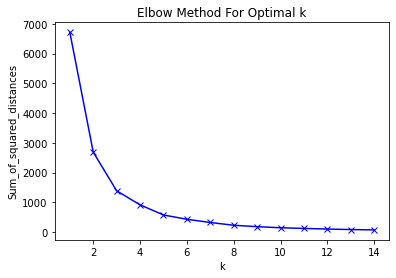

In [12]:
from sklearn.cluster import KMeans
from sklearn import metrics
import pylab as pl
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=100)
    #X = kmeans.fit(model.docvecs.doctag_syn0) ###using documnet vecter numbers. doctag_syn0 calls doc2vec that is trained earlier.
    X = kmeans.fit(model.dv.vectors)
    Sum_of_squared_distances.append(kmeans.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [13]:
kmeans = KMeans(n_clusters=5, init='k-means++', max_iter=100) ### elbow result shows 5 is the best results
#X = kmeans.fit(model.docvecs.doctag_syn0)
X = kmeans.fit(model.dv.vectors)
labels = kmeans.labels_.tolist()

kmeansdata = pd.read_csv("restaurant_doc2vec_embedding.csv")
kmeansdata.rename(columns={'Unnamed: 0':'documents'}, inplace=True)
kmeansdata

,documents,0,1,2,3,4,5,6,7,8,...,990,991,992,993,994,995,996,997,998,999
0,% Arabica (313@Somerset),0.411308,-0.018271,0.087780,0.022040,-0.039341,0.125903,-0.005261,0.197658,0.144011,...,0.027613,-0.074682,0.203255,0.001092,0.110647,-0.042997,-0.203987,-0.209596,-0.171008,-0.043929
1,% Arabica (Arab Street),0.372951,-0.016902,0.081222,0.018684,-0.036712,0.114708,-0.002983,0.179523,0.132075,...,0.024236,-0.067915,0.183324,0.000735,0.099385,-0.039660,-0.183944,-0.190733,-0.154694,-0.039939
2,% Arabica (Chip Bee Gardens),0.560045,-0.024410,0.119974,0.027779,-0.053465,0.171327,-0.005641,0.268688,0.197541,...,0.036404,-0.100217,0.275106,0.000584,0.148743,-0.057569,-0.275016,-0.285252,-0.231190,-0.059002
3,108 Matcha Saro (Suntec City),0.430590,-0.018215,0.093155,0.023097,-0.042154,0.132699,-0.003504,0.208277,0.152424,...,0.029195,-0.078200,0.210980,-0.000370,0.115635,-0.044039,-0.212427,-0.219946,-0.178293,-0.045773
4,136 Hong Kong Street Fish Head Steamboat (Joo ...,0.264220,-0.012285,0.056753,0.014388,-0.025019,0.080672,-0.001926,0.126789,0.093494,...,0.017137,-0.047435,0.130600,0.000095,0.070610,-0.028242,-0.130645,-0.134421,-0.110167,-0.027550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822,il Cielo,0.531007,-0.023417,0.114585,0.027734,-0.051988,0.161529,-0.004427,0.254362,0.186033,...,0.034347,-0.095173,0.260641,0.000632,0.142297,-0.055984,-0.261948,-0.270170,-0.219689,-0.056000
823,machi machi (Arab Street),0.901740,-0.038680,0.193836,0.047307,-0.086150,0.276278,-0.008705,0.433871,0.316906,...,0.059258,-0.162968,0.443707,0.000893,0.240766,-0.094423,-0.443669,-0.459040,-0.371797,-0.096199
824,micro bakery | kitchen,0.754884,-0.032808,0.162918,0.039246,-0.071823,0.229952,-0.008382,0.362704,0.264299,...,0.049848,-0.135482,0.370574,-0.000500,0.200742,-0.078230,-0.372595,-0.383887,-0.311400,-0.079402
825,rrooll (Jewel Changi Airport),0.558131,-0.024596,0.120532,0.029325,-0.052947,0.171507,-0.005859,0.269414,0.197177,...,0.035979,-0.100717,0.274947,-0.000163,0.149043,-0.058640,-0.275050,-0.285011,-0.230370,-0.059983


In [14]:

kmeansdata['kmeanscluster'] = labels

kmeansdata.head()

,documents,0,1,2,3,4,5,6,7,8,...,991,992,993,994,995,996,997,998,999,kmeanscluster
0,% Arabica (313@Somerset),0.411308,-0.018271,0.087780,0.022040,-0.039341,0.125903,-0.005261,0.197658,0.144011,...,-0.074682,0.203255,0.001092,0.110647,-0.042997,-0.203987,-0.209596,-0.171008,-0.043929,2
1,% Arabica (Arab Street),0.372951,-0.016902,0.081222,0.018684,-0.036712,0.114708,-0.002983,0.179523,0.132075,...,-0.067915,0.183324,0.000735,0.099385,-0.039660,-0.183944,-0.190733,-0.154694,-0.039939,2
2,% Arabica (Chip Bee Gardens),0.560045,-0.024410,0.119974,0.027779,-0.053465,0.171327,-0.005641,0.268688,0.197541,...,-0.100217,0.275106,0.000584,0.148743,-0.057569,-0.275016,-0.285252,-0.231190,-0.059002,4
3,108 Matcha Saro (Suntec City),0.430590,-0.018215,0.093155,0.023097,-0.042154,0.132699,-0.003504,0.208277,0.152424,...,-0.078200,0.210980,-0.000370,0.115635,-0.044039,-0.212427,-0.219946,-0.178293,-0.045773,2
4,136 Hong Kong Street Fish Head Steamboat (Joo ...,0.264220,-0.012285,0.056753,0.014388,-0.025019,0.080672,-0.001926,0.126789,0.093494,...,-0.047435,0.130600,0.000095,0.070610,-0.028242,-0.130645,-0.134421,-0.110167,-0.027550,0


In [15]:
kmeansdata['kmeanscluster'].value_counts()



2    299
0    231
4    200
1     79
3     18
Name: kmeanscluster, dtype: int64

In [16]:
df1 = kmeansdata[kmeansdata['kmeanscluster'] == 0]

df1.head()

,documents,0,1,2,3,4,5,6,7,8,...,991,992,993,994,995,996,997,998,999,kmeanscluster
4,136 Hong Kong Street Fish Head Steamboat (Joo ...,0.264220,-0.012285,0.056753,0.014388,-0.025019,0.080672,-0.001926,0.126789,0.093494,...,-0.047435,0.130600,0.000095,0.070610,-0.028242,-0.130645,-0.134421,-0.110167,-0.027550,0
9,603 Tau Sar Piah,0.324312,-0.014842,0.070153,0.015674,-0.030900,0.099065,-0.002979,0.155440,0.113437,...,-0.058795,0.158599,0.000798,0.087256,-0.032937,-0.158988,-0.164174,-0.133433,-0.033558,0
11,75 Ah Balling Peanut Soup (85 Fengshan Centre),0.269641,-0.010688,0.058287,0.014517,-0.025375,0.083528,-0.003442,0.130394,0.094112,...,-0.048928,0.132383,-0.000530,0.072967,-0.029033,-0.133318,-0.136588,-0.111534,-0.027607,0
13,7th Heaven KTV & Cafe (SAFRA Tampines),0.272850,-0.011324,0.059692,0.014275,-0.026684,0.083586,-0.003450,0.131271,0.097193,...,-0.050237,0.135196,0.001109,0.072817,-0.027690,-0.135019,-0.138959,-0.112421,-0.029389,0
16,9 Plus Cafe,0.282699,-0.012891,0.060566,0.015027,-0.026386,0.085950,-0.003020,0.135730,0.099089,...,-0.050908,0.138188,-0.000246,0.075734,-0.030048,-0.139070,-0.143260,-0.116623,-0.029660,0


In [17]:
df1documents = df1['documents']

df1documents.head()

4     136 Hong Kong Street Fish Head Steamboat (Joo ...
9                                      603 Tau Sar Piah
11       75 Ah Balling Peanut Soup (85 Fengshan Centre)
13               7th Heaven KTV & Cafe (SAFRA Tampines)
16                                          9 Plus Cafe
Name: documents, dtype: object

In [18]:
import nltk
nltk.download('wordnet')

from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string
stop = set(stopwords.words('english'))
exclude = set(string.punctuation) 
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    # stop_free = " ".join([i for i in doc.split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in df1documents]

[nltk_data] Downloading package wordnet to /Users/leslie/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [19]:
import gensim
from gensim import corpora

dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]  ##Bag of words Document_term_matrix create.

Lda = gensim.models.ldamodel.LdaModel

ldamodel = Lda(doc_term_matrix, num_topics=1, id2word = dictionary, passes=50)


print(ldamodel.print_topics(num_topics=1,num_words=30))

[(0, '0.011*"restaurant" + 0.010*"centre" + 0.010*"food" + 0.008*"cafe" + 0.007*"plaza" + 0.007*"bakery" + 0.006*"square" + 0.005*"singapore" + 0.005*"market" + 0.005*"street" + 0.005*"kitchen" + 0.005*"noodle" + 0.005*"city" + 0.004*"central" + 0.004*"bar" + 0.004*"park" + 0.004*"bugis" + 0.004*"junction" + 0.004*"seafood" + 0.004*"thai" + 0.004*"hub" + 0.004*"tampines" + 0.003*"road" + 0.003*"novena" + 0.003*"japanese" + 0.003*"hua" + 0.003*"hawker" + 0.003*"east" + 0.003*"seng" + 0.003*"mall"')]


In [20]:
output1 = []
for index, topic in ldamodel.show_topics(num_topics=1,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output1.append(w[0] for w in topic)
output1_df = pd.DataFrame(output1)
output1_df.to_csv('restaurant_ldamodel1.csv')

Topic: 0 
Words: ['restaurant', 'centre', 'food', 'cafe', 'plaza', 'bakery', 'square', 'singapore', 'market', 'street', 'kitchen', 'noodle', 'city', 'central', 'bar', 'park', 'bugis', 'junction', 'seafood', 'thai', 'hub', 'tampines', 'road', 'novena', 'japanese', 'hua', 'hawker', 'east', 'seng', 'mall']


In [21]:
df2 = kmeansdata[kmeansdata.kmeanscluster == 1]


df2documents = df2['documents']

doc_clean = [clean(doc).split() for doc in df2documents]
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

Lda2 = gensim.models.ldamodel.LdaModel

ldamodel2 = Lda(doc_term_matrix, num_topics=1, id2word = dictionary, passes=50)

print(ldamodel2.print_topics(num_topics=1, num_words=30))

[(0, '0.009*"bar" + 0.009*"orchard" + 0.007*"restaurant" + 0.006*"bay" + 0.006*"coffee" + 0.006*"gallery" + 0.006*"central" + 0.004*"bugis" + 0.004*"street" + 0.004*"plq" + 0.004*"tang" + 0.004*"marina" + 0.004*"sand" + 0.004*"takashimaya" + 0.004*"singapore" + 0.004*"square" + 0.004*"house" + 0.004*"village" + 0.004*"plaza" + 0.004*"tanjong" + 0.004*"pagar" + 0.004*"bakery" + 0.004*"ion" + 0.003*"italian" + 0.003*"crystal" + 0.003*"bread" + 0.003*"prawn" + 0.003*"great" + 0.003*"world" + 0.003*"nex"')]


In [22]:
output2 = []
for index, topic in ldamodel2.show_topics(num_topics=1,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output2.append(w[0] for w in topic)
output2_df = pd.DataFrame(output2)
output2_df.to_csv('restaurant_ldamodel2.csv')

Topic: 0 
Words: ['bar', 'orchard', 'restaurant', 'bay', 'coffee', 'gallery', 'central', 'bugis', 'street', 'plq', 'tang', 'marina', 'sand', 'takashimaya', 'singapore', 'square', 'house', 'village', 'plaza', 'tanjong', 'pagar', 'bakery', 'ion', 'italian', 'crystal', 'bread', 'prawn', 'great', 'world', 'nex']


In [23]:
df3 = kmeansdata[kmeansdata.kmeanscluster == 2]
# df3['documents'] = df3['documents'].values.astype(str)

df3documents = df3['documents']

doc_clean = [clean(doc).split() for doc in df3documents]
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

Lda3 = gensim.models.ldamodel.LdaModel

ldamodel3 = Lda(doc_term_matrix, num_topics=1, id2word = dictionary, passes=50)

print(ldamodel3.print_topics(num_topics=1, num_words=30))

[(0, '0.017*"restaurant" + 0.014*"bar" + 0.013*"centre" + 0.010*"coffee" + 0.009*"house" + 0.009*"orchard" + 0.009*"singapore" + 0.009*"cafe" + 0.009*"food" + 0.008*"street" + 0.008*"square" + 0.008*"market" + 0.008*"city" + 0.007*"plaza" + 0.007*"313somerset" + 0.006*"vivocity" + 0.006*"noodle" + 0.006*"bakery" + 0.006*"paragon" + 0.006*"central" + 0.005*"club" + 0.005*"tower" + 0.005*"old" + 0.005*"ramen" + 0.005*"king" + 0.005*"hotel" + 0.004*"westgate" + 0.004*"complex" + 0.004*"jem" + 0.004*"bugis"')]


In [24]:
output3 = []
for index, topic in ldamodel3.show_topics(num_topics=1,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output3.append(w[0] for w in topic)
output3_df = pd.DataFrame(output3)
output3_df.to_csv('restaurant_ldamodel3.csv')

Topic: 0 
Words: ['restaurant', 'bar', 'centre', 'coffee', 'house', 'orchard', 'singapore', 'cafe', 'food', 'street', 'square', 'market', 'city', 'plaza', '313somerset', 'vivocity', 'noodle', 'bakery', 'paragon', 'central', 'club', 'tower', 'old', 'ramen', 'king', 'hotel', 'westgate', 'complex', 'jem', 'bugis']


In [25]:
df4 = kmeansdata[kmeansdata.kmeanscluster == 3]
# df3['documents'] = df3['documents'].values.astype(str)

df4documents = df4['documents']

doc_clean = [clean(doc).split() for doc in df4documents]
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

Lda4 = gensim.models.ldamodel.LdaModel

ldamodel4 = Lda(doc_term_matrix, num_topics=1, id2word = dictionary, passes=50)

print(ldamodel4.print_topics(num_topics=1, num_words=30))

[(0, '0.005*"one" + 0.005*"coffee" + 0.005*"singapore" + 0.005*"house" + 0.005*"food" + 0.003*"story" + 0.003*"shaw" + 0.003*"village" + 0.003*"beach" + 0.003*"club" + 0.003*"plaza" + 0.003*"singapura" + 0.003*"world" + 0.003*"great" + 0.003*"bakery" + 0.003*"bread" + 0.003*"capitol" + 0.003*"marina" + 0.003*"city" + 0.003*"raffle" + 0.003*"airport" + 0.003*"changi" + 0.003*"jewel" + 0.003*"lavender" + 0.003*"kitchen" + 0.003*"the" + 0.003*"co" + 0.003*"coconut" + 0.003*"fine" + 0.003*"udon"')]


In [26]:
output4 = []
for index, topic in ldamodel4.show_topics(num_topics=1,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output4.append(w[0] for w in topic)
output4_df = pd.DataFrame(output4)
output4_df.to_csv('restaurant_ldamodel4.csv')

Topic: 0 
Words: ['one', 'coffee', 'singapore', 'house', 'food', 'story', 'shaw', 'village', 'beach', 'club', 'plaza', 'singapura', 'world', 'great', 'bakery', 'bread', 'capitol', 'marina', 'city', 'raffle', 'airport', 'changi', 'jewel', 'lavender', 'kitchen', 'the', 'co', 'coconut', 'fine', 'udon']


In [27]:
df5 = kmeansdata[kmeansdata.kmeanscluster == 4]
# df3['documents'] = df3['documents'].values.astype(str)

df5documents = df5['documents']

doc_clean = [clean(doc).split() for doc in df5documents]
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

Lda5 = gensim.models.ldamodel.LdaModel

ldamodel5 = Lda(doc_term_matrix, num_topics=1, id2word = dictionary, passes=50)

print(ldamodel5.print_topics(num_topics=1, num_words=30))

[(0, '0.016*"restaurant" + 0.011*"singapore" + 0.011*"bar" + 0.010*"centre" + 0.009*"city" + 0.009*"kitchen" + 0.008*"food" + 0.008*"road" + 0.008*"street" + 0.007*"bakery" + 0.007*"plaza" + 0.007*"grill" + 0.007*"funan" + 0.007*"coffee" + 0.007*"hotel" + 0.006*"park" + 0.006*"suntec" + 0.006*"cafe" + 0.006*"orchard" + 0.006*"house" + 0.006*"airport" + 0.004*"noodle" + 0.004*"ion" + 0.004*"jalan" + 0.004*"jewel" + 0.004*"changi" + 0.004*"bee" + 0.004*"le" + 0.004*"hua" + 0.004*"one"')]


In [28]:
output5 = []
for index, topic in ldamodel5.show_topics(num_topics=1,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output5.append(w[0] for w in topic)
output5_df = pd.DataFrame(output5)
output5_df.to_csv('restaurant_ldamodel5.csv')

Topic: 0 
Words: ['restaurant', 'singapore', 'bar', 'centre', 'city', 'kitchen', 'food', 'road', 'street', 'bakery', 'plaza', 'grill', 'funan', 'coffee', 'hotel', 'park', 'suntec', 'cafe', 'orchard', 'house', 'airport', 'noodle', 'ion', 'jalan', 'jewel', 'changi', 'bee', 'le', 'hua', 'one']


In [29]:
df6 = kmeansdata
# df3['documents'] = df3['documents'].values.astype(str)

df6documents = df6['documents']

doc_clean = [clean(doc).split() for doc in df6documents]
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

Lda6 = gensim.models.ldamodel.LdaModel

ldamodel6 = Lda(doc_term_matrix, num_topics=5, id2word = dictionary, passes=50)

print(ldamodel6.print_topics(num_topics=5, num_words=30))

[(0, '0.028*"bar" + 0.028*"junction" + 0.025*"grill" + 0.025*"bugis" + 0.015*"thai" + 0.015*"gallery" + 0.013*"jem" + 0.013*"jalan" + 0.013*"izakaya" + 0.012*"8" + 0.012*"japanese" + 0.010*"donki" + 0.010*"geylang" + 0.010*"besar" + 0.010*"downtown" + 0.010*"mall" + 0.009*"bakery" + 0.008*"cafe" + 0.008*"cuisine" + 0.008*"kee" + 0.008*"mee" + 0.008*"pasir" + 0.008*"dining" + 0.008*"ang" + 0.008*"soi" + 0.008*"dough" + 0.008*"thomson" + 0.008*"house" + 0.005*"bistro" + 0.005*"100am"'), (1, '0.049*"coffee" + 0.045*"orchard" + 0.037*"singapore" + 0.031*"restaurant" + 0.021*"central" + 0.019*"hotel" + 0.019*"seafood" + 0.019*"co" + 0.017*"ion" + 0.013*"takashimaya" + 0.013*"tower" + 0.012*"hua" + 0.011*"bar" + 0.011*"bee" + 0.011*"payoh" + 0.011*"toa" + 0.011*"gallery" + 0.009*"hougang" + 0.009*"somerset" + 0.009*"alexandra" + 0.009*"rice" + 0.009*"guoco" + 0.009*"telok" + 0.009*"noodle" + 0.007*"ah" + 0.007*"teochew" + 0.006*"capitol" + 0.006*"111" + 0.006*"ayer" + 0.006*"mile"'), (2, '0.

In [30]:
output6 = []
for index, topic in ldamodel6.show_topics(num_topics=5,formatted=False, num_words= 30):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))
    output5.append(w[0] for w in topic)
output6_df = pd.DataFrame(output6)
output6_df.to_csv('restaurant_ldamodel_all.csv')

Topic: 0 
Words: ['bar', 'junction', 'grill', 'bugis', 'thai', 'gallery', 'jem', 'jalan', 'izakaya', '8', 'japanese', 'donki', 'geylang', 'besar', 'downtown', 'mall', 'bakery', 'cafe', 'cuisine', 'kee', 'mee', 'pasir', 'dining', 'ang', 'soi', 'dough', 'thomson', 'house', 'bistro', '100am']
Topic: 1 
Words: ['coffee', 'orchard', 'singapore', 'restaurant', 'central', 'hotel', 'seafood', 'co', 'ion', 'takashimaya', 'tower', 'hua', 'bar', 'bee', 'payoh', 'toa', 'gallery', 'hougang', 'somerset', 'alexandra', 'rice', 'guoco', 'telok', 'noodle', 'ah', 'teochew', 'capitol', '111', 'ayer', 'mile']
Topic: 2 
Words: ['centre', 'food', 'plaza', 'city', 'cafe', 'market', 'bakery', 'airport', 'changi', 'suntec', 'jewel', 'bay', 'tang', 'singapura', 'amoy', 'raffle', 'street', 'marina', 'bukit', 'nex', 'sand', 'pagar', 'tanjong', 'kitchen', 'scott', 'road', 'garden', 'square', 'far', 'timah']
Topic: 3 
Words: ['vivocity', 'park', '313somerset', 'road', 'funan', 'paragon', 'westgate', 'club', 'square'